In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, plot_roc_curve, roc_auc_score, confusion_matrix, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

Load in 2-gram and 3-gram distribution data

In [3]:
benign_length_str = "temp_csvs/benign_length.csv"
benign_distinct_str = "temp_csvs/benign_length_distinct.csv"

malware_length_str = "temp_csvs/malware_length.csv"
malware_distinct_str = "temp_csvs/malware_length_distinct.csv"

benign_length = np.loadtxt(benign_length_str, delimiter = ",")
malware_length = np.loadtxt(malware_length_str, delimiter=",")

benign_distinct = np.loadtxt(benign_distinct_str, delimiter = ",")
malware_distinct = np.loadtxt(malware_distinct_str, delimiter=",")

classes_ = np.concatenate((np.zeros(len(benign_length)), np.ones(len(malware_length))), axis = 0) 

benign_3gram_str = "temp_csvs/3gram_benign_length_distinct.csv"
malware_3gram_str = "temp_csvs/3gram_malware_length_distinct.csv"

benign_3gram_distinct = np.loadtxt(benign_3gram_str, delimiter = ",")
malware_3gram_distinct = np.loadtxt(malware_3gram_str, delimiter=",")

In [4]:
data_2grams = pd.read_csv("temp_csvs/2gram_length_distinct_v2.csv")
data_3grams = pd.read_csv("temp_csvs/3gram_length_distinct_v2.csv")

# Rename columns for intersection
data_2grams = data_2grams.rename(columns={'number': '2grams'})
data_3grams = data_3grams.rename(columns={'number': '3grams'})
data_3grams = data_3grams.drop('class', axis = 'columns')

print(data_2grams.head())

                                          file  class  2grams   length
0  VirusShare_0008ce316ab158232a488f3b7b4b65e3      1   40012   207871
1  VirusShare_001fd7ade105f27faeb461e9782a63e8      1   63214   745983
2  VirusShare_006c48d6dbddbc0cd9c16b36c1da5da0      1   42181  2261112
3  VirusShare_007c4edc6e1ca963a9b2e05e136142f2      1   10798   224255
4  VirusShare_0089c7cb5f4f84c1d18024fe69314ec0      1   11284   180223


Merge distribution information into one dataframe

In [5]:
# Merge two data frames via intersection as not all files are present in both individual data frames
data = pd.merge(data_2grams, data_3grams, how ='inner', on =['file'])
data_orig = data
print(data.head())
print(len(data_2grams) - len(data)) # lose a small amount of data


benign_2grams = data[data['class'] == 0]['2grams']
malware_2grams = data[data['class'] == 1]['2grams']


benign_3grams = data[data['class'] == 0]['3grams']
malware_3grams = data[data['class'] == 1]['3grams']

benign_length = data[data['class'] == 0]['length']
malware_length = data[data['class'] == 1]['length']

classes = data['class']
data = data.drop('file', axis = 'columns').drop('class', axis = 'columns')

                                          file  class  2grams   length  3grams
0  VirusShare_0008ce316ab158232a488f3b7b4b65e3      1   40012   207871  112655
1  VirusShare_001fd7ade105f27faeb461e9782a63e8      1   63214   745983  330862
2  VirusShare_006c48d6dbddbc0cd9c16b36c1da5da0      1   42181  2261112  174909
3  VirusShare_007c4edc6e1ca963a9b2e05e136142f2      1   10798   224255   25912
4  VirusShare_0089c7cb5f4f84c1d18024fe69314ec0      1   11284   180223  124275
1364


Obfuscated benign file distributions

In [6]:
XOR_2grams = pd.read_csv("temp_csvs/XOR_2grams.csv")
XOR_3grams = pd.read_csv("temp_csvs/XOR_3grams.csv")

XOR_2grams = XOR_2grams.rename(columns={'number': '2grams'})
XOR_3grams = XOR_3grams.rename(columns={'number': '3grams'})
XOR_3grams = XOR_3grams.drop('class', axis = 'columns').drop('length', axis = 'columns')

XOR = pd.merge(XOR_2grams, XOR_3grams, how ='inner', on =['file'])
XOR.head()

,file,class,2grams,length,3grams
0,libz.dll,0,55335,121271,120819
1,B330.dll,0,21653,26247,26226
2,BackgroundActivatorDLL.dll,0,33450,47103,47040
3,BackgroundMediaPolicy.dll,0,37120,54783,54687
4,BackupRestore.dll,0,65536,929791,904412


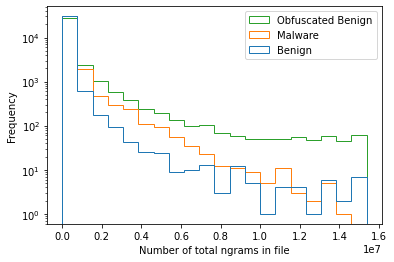

In [8]:
plt.figure()
plt.hist([benign_3grams, malware_3grams, XOR['3grams']], bins = 20, label = ['Benign', 'Malware', 'Obfuscated Benign'], histtype = 'step');
plt.yscale('log', nonpositive='clip')
#plt.xlim(0,0.5e7)
plt.xlabel("Number of total ngrams in file")
plt.ylabel("Frequency")
plt.legend(loc = "upper right")

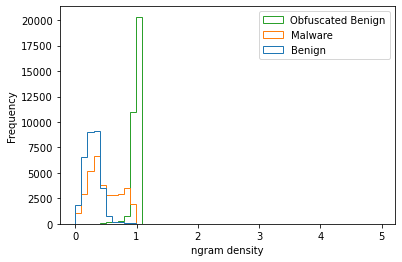

In [9]:
density_2d_benign = benign_2grams / benign_length
density_2d_malware = malware_2grams/malware_length

density_3d_benign = benign_3grams / benign_length
density_3d_benign = density_3d_benign[density_3d_benign <= 1] # some erroneous values greater than 1?
density_3d_malware = malware_3grams/malware_length
density_3d_malware = density_3d_malware[density_3d_malware <= 1]

plt.figure()


plt.hist([density_3d_benign, density_3d_malware, XOR['3grams']/ XOR['length']], 
        bins = 50, label = ['Benign', 'Malware', 'Obfuscated Benign'], histtype = 'step');


#plt.yscale('log', nonpositive='clip')
#plt.xlim(0,1)
plt.xlabel("ngram density")
plt.ylabel("Frequency")
plt.legend()

36000


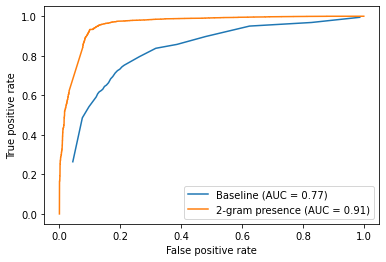

In [11]:
# Baseline model using number of unique 2-grams as cut
X_train, X_test, y_train, y_test = train_test_split(data['2grams'], classes, test_size=0.33, random_state=42)

def my_test(X_in, y_in):    
    threshold = [1000,5000,10000,15000,20000,25000,30000,35000,36000,37000,38000,39000,
        40000,41000,42000,43000,44000,45000,46000,47000,48000,49000,50000,55000,60000,65000]

    fpr_ = []
    tpr_ = []
    auc_max = 0
    max_threshold = 0
    for y in threshold:
        results = []
        for x in X_in:
            if x > y:
                results.append(1)
            else:
                results.append(0)

        tn, fp, fn, tp = confusion_matrix(y_in, results).ravel()
        tpr = tp / (tp + fn)
        fpr = 1 - ( tn / (tn+fp))
        auc = roc_auc_score(y_in, results)

        score_acc = accuracy_score(y_in, results)
        score_prec = precision_score(y_in, results)
        score_rec = recall_score(y_in, results)

        if auc > auc_max:
            auc_max = auc
            
            max_threshold = y


        score_acc = accuracy_score(y_in, results)
        #print("Threshold: ",  y, " AUC: ", roc_auc_score(y_in, results), "Accuracy:", score_acc)
        
        fpr_.append(fpr)
        tpr_.append(tpr)
        

    return np.asarray(fpr_), np.asarray(tpr_), auc_max, max_threshold

fpr, tpr, auc_max, max_threshold = my_test(X_train, y_train)
np.savetxt("temp_csvs/baseline.csv", [fpr,tpr])
print(max_threshold)

# false positive rates and true positive rates for n-gram presence model
fpr_load = np.loadtxt("temp_csvs/fpr.csv")
tpr_load = np.loadtxt("temp_csvs.tpr.csv")


plt.figure()
plt.plot(fpr, tpr, label = f"Baseline (AUC = {auc_max:.2f})")
plt.plot(fpr_load, tpr_load, label = f'2-gram presence (AUC = 0.91)')
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.legend(loc = "lower right")

In [10]:
X_train_2d, X_test_2d, y_train_2d, y_test_2d = train_test_split(data[['2grams', 'length']], classes, test_size=0.33, random_state=40)
clf_svm = Pipeline((
            ("scaler", StandardScaler()),
            ("svm_clf", SVC(kernel="rbf", C = 10, class_weight = 'balanced',probability=True))
        ))

clf_svm.fit(X_train_2d, y_train_2d)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf',
                 SVC(C=10, class_weight='balanced', probability=True))])

[[9505  869]
 [1097 9963]]
Accuracy: 0.9082765699356163
Precision: 0.919774741506647
Recall: 0.9008137432188065
Specificity: 0.9162328899171004
AUC: 0.9569614195803878


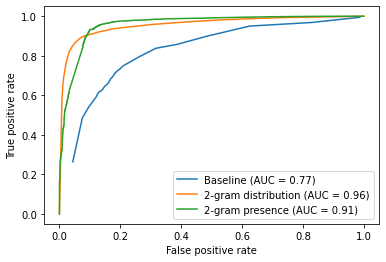

In [12]:
y_test_svm = clf_svm.predict(X_test_2d)
y_scores_svm = clf_svm.predict_proba(X_test_2d)[:,1]

score_acc = accuracy_score(y_test_2d, y_test_svm)
score_prec = precision_score(y_test_2d, y_test_svm)
score_rec = recall_score(y_test_2d, y_test_svm)
score_auc = roc_auc_score(y_test_2d, y_scores_svm)
fpr_2d, tpr_2d, thresholds_2d = roc_curve(y_test_2d.to_numpy(), y_scores_svm)

tn, fp, fn, tp = confusion_matrix(y_test_2d, y_test_svm).ravel()
score_spec = tn / (tn+fp)

print(confusion_matrix(y_test_2d, y_test_svm))

print("Accuracy:", score_acc)
print("Precision:", score_prec)
print("Recall:", score_rec)
print("Specificity:", score_spec)
print("AUC:", score_auc)
 
plt.figure()
plt.plot(fpr, tpr, label = f"Baseline (AUC = {auc_max:.2f})")
plt.plot(fpr_2d, tpr_2d, label = f"2-gram distribution (AUC = {score_auc:.2f})")
plt.plot(fpr_load, tpr_load, label = f'2-gram presence (AUC = 0.91)')
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.legend(loc = "lower right")

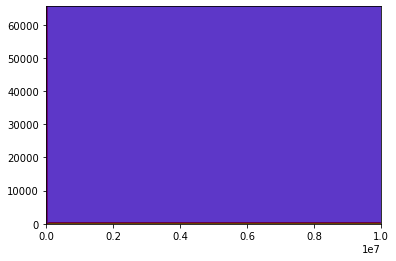

In [29]:
xlim = (0,1e7 ) #data['length'].max()
ylim = (0, 65536) # 

xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 150),
                     np.linspace(ylim[0], ylim[1], 150))


# Only works with SVM
y_pred_svm = clf_svm.predict(np.c_[yy.ravel(), xx.ravel()]).reshape(xx.shape)
y_decision_svm = clf_svm.decision_function(np.c_[yy.ravel(), xx.ravel()]).reshape(xx.shape)



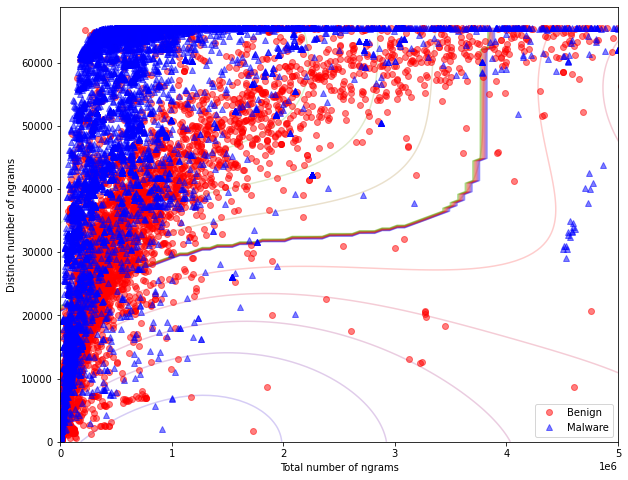

In [ ]:
plt.figure(figsize = (10,8))

plt.plot(X_test_2d[y_test_2d == 0]['length'], X_test_2d[y_test_2d == 0]['2grams'], 'ro', alpha = 0.5, label = "Benign")
plt.plot(X_test_2d[y_test_2d == 1]['length'], X_test_2d[y_test_2d == 1]['2grams'], 'b^', alpha = 0.5, label = "Malware")

#plt.plot(X_train_2d[y_train_2d == 0]['length'], X_train_2d[y_train_2d == 0]['2grams'], 'ro', alpha = 0.5, label = "Benign")
#plt.plot(X_train_2d[y_train_2d == 1]['length'], X_train_2d[y_train_2d == 1]['2grams'], 'b^', alpha = 0.5, label = "Malware")

plt.contour(xx, yy, y_pred_svm, cmap=plt.cm.brg, alpha=0.4, zorder = 1) #decision function boundary 
plt.contour(xx, yy, y_decision_svm, cmap=plt.cm.brg, alpha=0.2, levels = 10)#decision function contours
#plt.xlim(0,xlim[1])
plt.xlim(0,0.5e7)



plt.xlabel("Total number of ngrams")
plt.ylabel("Distinct number of ngrams")
plt.legend();



In [ ]:
def train_models(X_train, X_test, y_train, y_test):
    """
    Function to train different ML algorithms, plot roc curve and return false postive and true positive rates for random forest 
    classifier for comparisons
    """


    classifier_names = ['Decision Tree',
                        'Boosted Decision Tree',
                        'Random Forest',
                        'Support Vector Machine',
                        'Neural Network']

    # Using mostly default parameters here but can be varied e.g. learning rate or regularisation amount, models are quite robust
    classifiers = [DecisionTreeClassifier(random_state=42), 
                GradientBoostingClassifier(random_state=42),
                RandomForestClassifier(random_state=42), 
                SVC(kernel="rbf", C = 10, class_weight = 'balanced',probability=True, random_state = 42),
                MLPClassifier(max_iter=500, random_state=42)]    

    fig = plt.figure()
    for classifier, name in zip(classifiers, classifier_names):

        clf = Pipeline((
                    ("scaler", StandardScaler()),
                    (name, classifier)
                ))

        clf.fit(X_train , y_train)
        y_pred = clf.predict(X_test)
        y_scores = clf.predict_proba(X_test)[:,1]
        score_acc = accuracy_score(y_test, y_pred)
        score_prec = precision_score(y_test, y_pred)
        score_rec = recall_score(y_test, y_pred)
        score_auc = roc_auc_score(y_test, y_scores)
        fpr_clf, tpr_clf, thresholds = roc_curve(y_test.to_numpy(), y_scores)

        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        score_spec = tn / (tn+fp)

        print(name)
        print(confusion_matrix(y_test, y_pred))

        if name == 'Random Forest':
            fpr = fpr_clf
            tpr = tpr_clf 


        print("Accuracy:", score_acc)
        print("Precision:", score_prec)
        print("Recall:", score_rec)
        print("Specificity:", score_spec)
        print("AUC:", score_auc)

        plt.plot(fpr_clf, tpr_clf, label=f"{name} (AUC = {score_auc:.2f})")

    plt.xlabel("False positive rate")
    plt.ylabel("True positive rate")
    #plt.axis("scaled")
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.legend()

    return fpr, tpr

 

In [ ]:
X_train_2d, X_test_2d, y_train_2d, y_test_2d = train_test_split(data['2grams', 'length'], classes, test_size=0.33, random_state=42)
fpr_2d, tpr_2d = train_models(X_train_2d, X_test_2d, y_train_2d, y_test_2d)

Decision Tree
[[ 9287  1121]
 [  967 10059]]
Accuracy: 0.9025846785481011
Precision: 0.899731663685152
Recall: 0.912298204244513
Specificity: 0.8922943889315911
AUC: 0.9022962965880521
Boosted Decision Tree
[[9433  975]
 [1792 9234]]
Accuracy: 0.8709060371372586
Precision: 0.9044960329121363
Recall: 0.837475058951569
Specificity: 0.9063220599538816
AUC: 0.9297126277446655
Random Forest
[[ 9838   570]
 [  788 10238]]
Accuracy: 0.9366427171783148
Precision: 0.9472612879348631
Recall: 0.9285325594050426
Specificity: 0.9452344350499615
AUC: 0.9746303649831652
Support Vector Machine
[[9486  922]
 [2804 8222]]
Accuracy: 0.8261640384435943
Precision: 0.8991688538932633
Recall: 0.7456920007255577
Specificity: 0.9114142966948501
AUC: 0.8760145426302139
Neural Network
[[9377 1031]
 [1982 9044]]
Accuracy: 0.859428944667351
Precision: 0.8976674937965261
Recall: 0.8202430618538001
Specificity: 0.9009415833973866
AUC: 0.9142366470670331


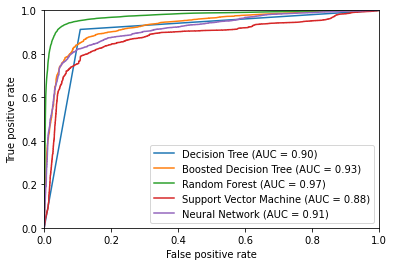

In [13]:
X_train_3d, X_test_3d, y_train_3d, y_test_3d = train_test_split(data, classes, test_size=0.33, random_state=42)
fpr_3d, tpr_3d = train_models(X_train_3d, X_test_3d, y_train_3d, y_test_3d)

In [14]:
# Load in some of the most commonly occuring n-grams in best performing models - full list founf in count.txt
#Counter({'7a41': 28, '6af4': 24, '8a46': 23, '5157': 21, '2a40': 18, '5b59': 16, 'a55e': 16, 'db67': 16, 'ce61': 15})
ngrams_best = ['7a41', '6af4', '8a46', '5157', '2a40', '5b59', 'a55e', 'db67', 'ce61']
best_ngrams_train = pd.read_csv('temp_csvs/ngram_presence_train.csv', usecols=["file", "class"]+ngrams_best)
best_ngrams_test = pd.read_csv('temp_csvs/ngram_presence_test.csv', usecols=["file", "class"]+ngrams_best)
best_ngrams_train.head()

,file,class,5b59,5157,a55e,6af4,2a40,db67,8a46,7a41,ce61
0,VirusShare_000573bf13fea074b3ec2e36dba57932,1,1,1,1,1,1,1,1,1,1
1,VirusShare_001ff834ff8abb42314d782fa79605b6,1,1,1,1,1,1,1,1,1,1
2,VirusShare_00202a5a32a76b73525d72b044898664,1,1,1,1,1,1,1,1,1,1
3,VirusShare_0026837efde126f59238b7452d1a01c2,1,1,1,0,0,1,1,1,1,0
4,VirusShare_00275dd947649594fc50e0197f6ee3d5,1,0,0,0,0,0,0,0,0,0


In [16]:
concatenated = pd.concat([best_ngrams_train, best_ngrams_test])
data_combined = pd.merge(data_orig, concatenated, how ='inner', on =['file', 'class'])

classes_combined = data_combined['class']
data_combined = data_combined.drop('file', axis = 1).drop('class',axis = 1)

Random Forest
[[ 8522   490]
 [  726 10397]]
Accuracy: 0.939607648373479
Precision: 0.9549921925231928
Recall: 0.9347298390721928
Specificity: 0.9456280514869063
AUC: 0.9792041939226227


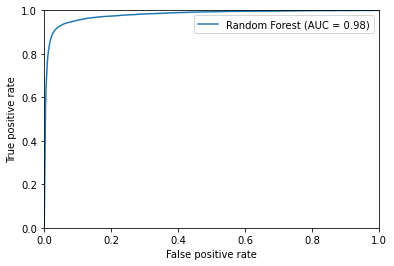

In [17]:
X_train_combined, X_test_combined, y_train_combined, y_test_combined = train_test_split(data_combined, classes_combined, test_size=0.33, random_state=40)
fpr_combined_small, tpr_combined_small = train_models(X_train_combined, X_test_combined, y_train_combined, y_test_combined)

In [18]:
# Load in 1000 random n-grams and add into model with distribution informatioj
import random
n_max = 1000
random_idx = [0,1] + random.sample(range(2, 256**2 - 1), n_max)

full_ngrams_train = pd.read_csv('temp_csvs/ngram_presence_train.csv', usecols=random_idx)
full_ngrams_test = pd.read_csv('temp_csvs/ngram_presence_test.csv', usecols=random_idx)
full_ngrams_train.head()


concatenated_full = pd.concat([full_ngrams_train, full_ngrams_test])
data_full = pd.merge(data_orig, concatenated_full, how ='inner', on =['file', 'class'])

classes_full = data_full['class']
data_full = data_full.drop('file', axis = 1).drop('class',axis = 1)

In [19]:
X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(data_full, classes_full, test_size=0.33, random_state=40)

clf_full = Pipeline((
            ("scaler", StandardScaler()),
            ("rf", RandomForestClassifier(random_state=42))
        ))
clf_full.fit(X_train_full, y_train_full)

Pipeline(steps=[('scaler', StandardScaler()),
                ('rf', RandomForestClassifier(random_state=42))])

In [22]:
y_pred = clf_full.predict(X_test_full)
y_scores = clf_full.predict_proba(X_test_full)[:,1]
score_acc = accuracy_score(y_test_full, y_pred)
score_prec = precision_score(y_test_full, y_pred)
score_rec = recall_score(y_test_full, y_pred)
score_auc = roc_auc_score(y_test_full, y_scores)
fpr_full, tpr_full, thresholds_mlp = roc_curve(y_test_full.to_numpy(), y_scores)

tn, fp, fn, tp = confusion_matrix(y_test_full, y_pred).ravel()
score_spec = tn / (tn+fp)
print(confusion_matrix(y_test_full, y_pred))

print("Accuracy:", score_acc)
print("Precision:", score_prec)
print("Recall:", score_rec)
print("Specificity:", score_spec)
print("AUC:", score_auc)

[[ 8670   342]
 [  539 10584]]
Accuracy: 0.9562453439284827
Precision: 0.9686985172981878
Recall: 0.9515418502202643
Specificity: 0.9620505992010653
AUC: 0.9886917586065732


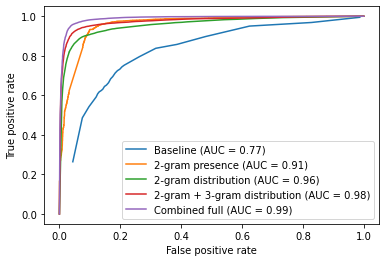

In [25]:
plt.figure()
plt.plot(fpr, tpr, label = f"Baseline (AUC = {auc_max:.2f})")
plt.plot(fpr_load, tpr_load, label = f'2-gram presence (AUC = 0.91)')
plt.plot(fpr_2d, tpr_2d, label = f'2-gram distribution (AUC = 0.96)')
plt.plot(fpr_3d, tpr_3d, label = f"2-gram + 3-gram distribution (AUC = 0.98)")
#plt.plot(fpr_rf, tpr_rf, label = f"Combined (AUC = 0.98)")
plt.plot(fpr_full, tpr_full, label = f"Combined full (AUC = 0.99)")



plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.legend(loc = "lower right")
